In [2]:
# import the necessary packages
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d,ConvexHull,Delaunay
import cv2
import matplotlib.pyplot as plt
from rdfpy import rdf
from collections import Counter,OrderedDict
%matplotlib notebook

In [ ]:
def generateTriangularLattice(N):
    a = 40*np.array([1,0])
    b = 40*np.array([1/2, np.sqrt(3)/2])
    triangularLattice = np.zeros((N*N,2))
    for i in range(N):
        for j in range(N):
            triangularLattice[N*i+j] = i*a + j*b
    return triangularLattice


In [4]:
cam = cv2.VideoCapture("C0018.mp4")
currentframe=0
while(currentframe<25*60):     
    ret,frame = cam.read()
    if ret and currentframe==1499:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        #detect
        #circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 0.0001, 42,param1=50 ,param2=12 ,minRadius=21 ,maxRadius=24 )
        #circles=circles[0, :]
    currentframe += 1

<IPython.core.display.Javascript object>


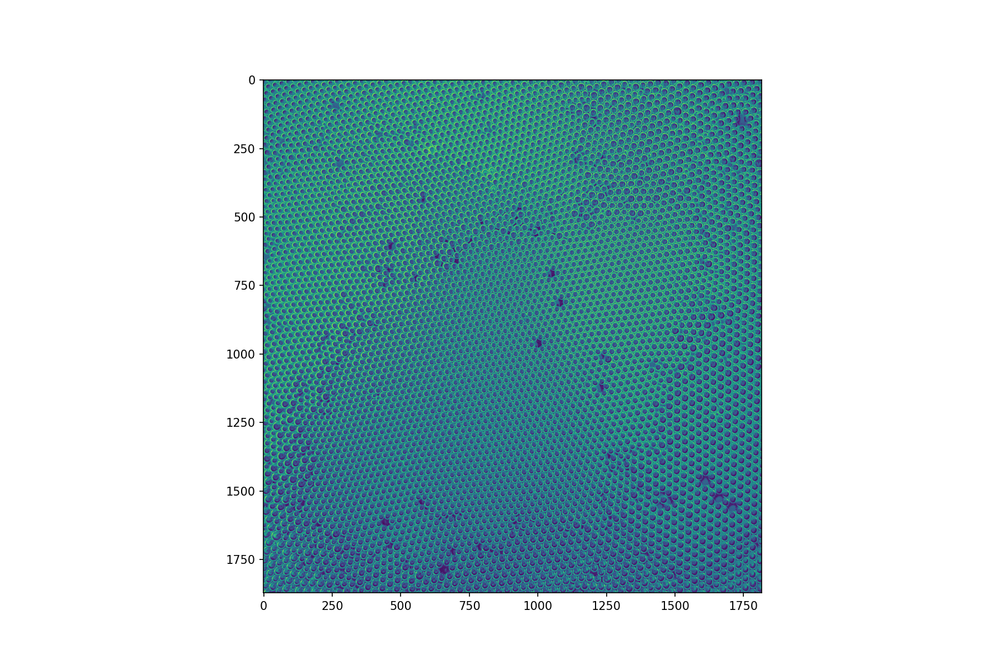

In [3]:
image = cv2.imread('imageBig.jpg')
#output1 = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#gray=cv2.GaussianBlur(gray, (21,21), cv2.BORDER_DEFAULT)
fig=plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')
plt.imshow(gray)
plt.show()

In [ ]:
gray1=gray[:,250:]

In [6]:
subtracted=cv2.absdiff(gray1,gray2)
fig=plt.figure(dpi= 150, facecolor='w', edgecolor='k')
plt.imshow(subtracted)
plt.show()
print(np.count_nonzero(subtracted))

NameError: name 'gray1' is not defined

In [5]:
def similarity(gray1,gray2):
    th1 = cv2.adaptiveThreshold(gray1,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,51,-10)
    th2 = cv2.adaptiveThreshold(gray2,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,51,-10)
    ys=[]
    for shift in range(0,6):
        subtracted=cv2.absdiff(th1,translate(th2,shift))
        ys.append(np.count_nonzero(subtracted))
    sim=min(ys)
    optshift=ys.index(sim)
    img=cv2.absdiff(th1,translate(th2,optshift))
    erode=cv2.erode(img,None,iterations=1)
    sim=np.count_nonzero(erode)
    if sim>0:
        fig=plt.figure(dpi= 150, facecolor='w', edgecolor='k')
        plt.imshow(erode)
        plt.show()
    return sim,optshift
similarity(gray1,gray2)

NameError: name 'gray1' is not defined

In [14]:
def translate(img,x):
    translation_matrix = np.float32([ [1,0,0], [0,1,x] ])   
    img_translation = cv2.warpAffine(img, translation_matrix, (img.shape[1],img.shape[0]))   
    return img_translation

<IPython.core.display.Javascript object>


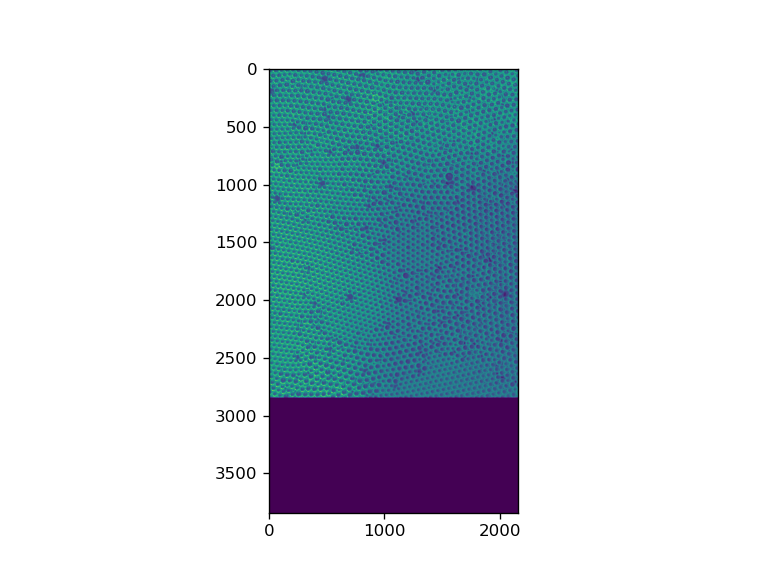

In [19]:
plt.figure()
plt.imshow(translate(gray1,-1000))

In [17]:
#Canny edge detection
max_lowThreshold = 300
window_name = 'Edge Map'
title_trackbar = 'Min Threshold:'
ratio = 2
kernel_size = 3
def CannyThreshold(val):
    low_threshold = val
    #img_blur = cv2.blur(src_gray, (3,3))
    detected_edges = cv2.Canny(src_gray, low_threshold, low_threshold*ratio, kernel_size)
    mask = detected_edges != 0
    dst = src * (mask.astype(src.dtype))
    cv2.imshow(window_name, dst)

src=gray
src_gray = gray
cv2.namedWindow(window_name)
cv2.createTrackbar(title_trackbar, window_name , 0, max_lowThreshold, CannyThreshold)
CannyThreshold(0)
cv2.waitKey()
cv2.destroyAllWindows()

<IPython.core.display.Javascript object>


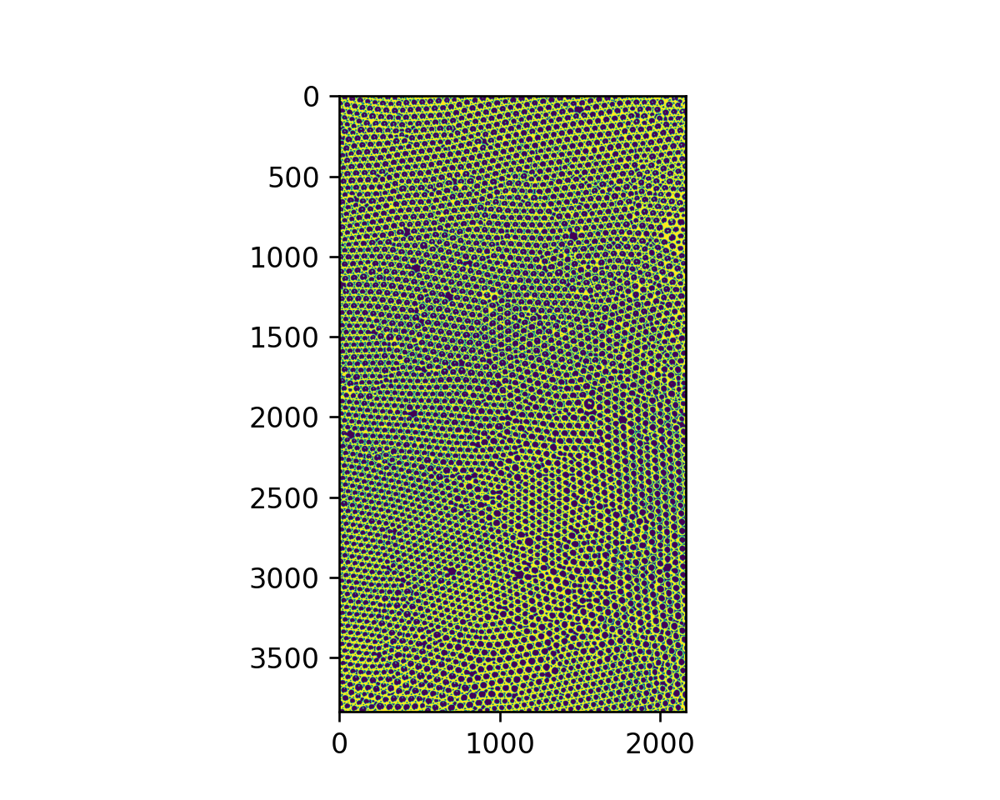

In [17]:
plt.figure(figsize=(5,4), dpi= 200)
th = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,51,0)
plt.imshow(th)

In [543]:
def mergehoughs(c1,c2):
    for c in c2:
        cx=c[:2]
        print(np.min(np.linalg.norm(c1[:,:2]-cx,axis=1)))
        if np.min(np.linalg.norm(c1[:,:2]-cx,axis=1)-c1[:,2])>0:
            c1=np.vstack((c1,c))
            print(cx)
    return c1
merged=mergehoughs(circles1,circles2)

1.0
38.209946
[497.5 208.5]
37.48333
[461.5 288.5]
38.832977
[1051.5  574.5]
2.236068
41.109608
[1255.5  814.5]
6.4031243
7.28011
6.708204
2.236068


In [27]:
circles1 = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 0.001, 18,param1=440 ,param2=12 ,minRadius=9 ,maxRadius=13 )
#circles1 = np.round(circles1[0, :]).astype("int")

circles1=circles1[0, :]#[:,0:2]

#circles2 = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 0.0001, 24,param1=200 ,param2=18 ,minRadius=12 ,maxRadius=17 )
#circles1 = np.round(circles1[0, :]).astype("int")

#circles2=circles2[0, :]#[:,0:2]

#circles3 = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 0.00001, 6,param1=30 ,param2=30 ,minRadius=3 ,maxRadius=15 )
#circles1 = np.round(circles1[0, :]).astype("int")

#circles3=circles3[0, :]#[:,0:2]

#output1 = frame.copy()

<IPython.core.display.Javascript object>


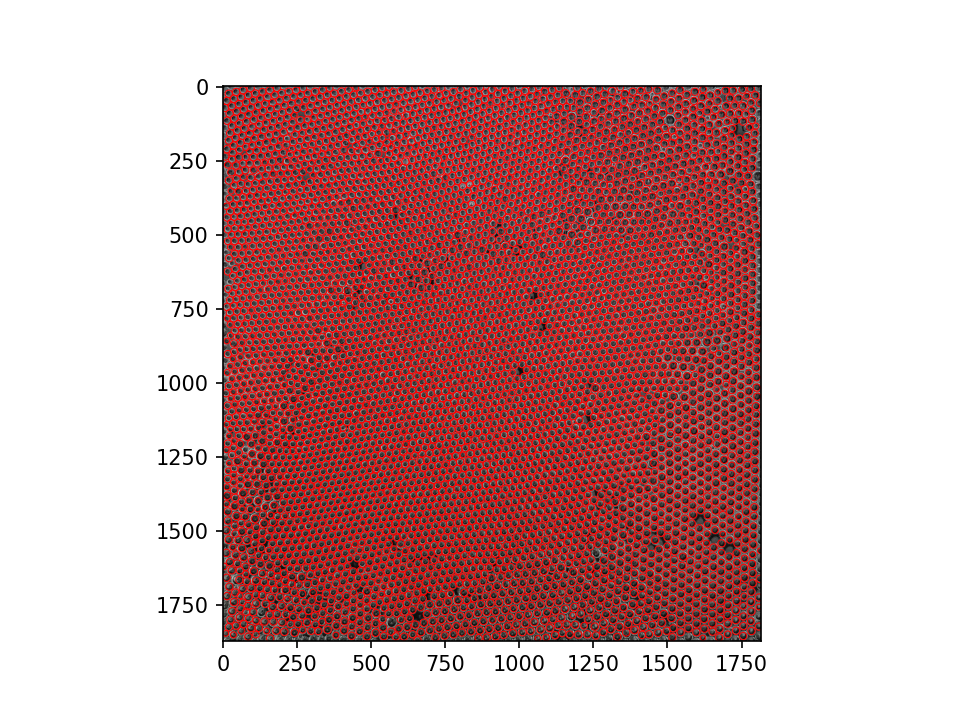

In [28]:
fig=plt.figure(dpi= 150, facecolor='w', edgecolor='k')
ax=fig.gca()
plt.ion()
plt.imshow(image)
for (x,y,r) in circles1:
    cc = plt.Circle(( x , y ), r ,fill=False,color='r',lw=0.5)
    #cc = plt.Circle(( x , y ), 1 ,fill=True,color='r',lw=0.5)
    ax.add_artist( cc )
    #cv2.circle(output1, (x, y), r,(0, 255, 0), 4)
    #cv2.rectangle(output1, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)
    
#for (x,y,r) in circles2:
    #cc = plt.Circle(( x , y ), r ,fill=False,color='g',lw=0.5)
    #cc = plt.Circle(( x , y ), 1 ,fill=True,color='g',lw=0.5)
    #ax.add_artist( cc )
#plt.savefig('detected_image/identify_circle1.png')

#for (x,y,r) in circles3:
    #cc = plt.Circle(( x , y ), r ,fill=False,color='b',lw=0.5)
    #cc = plt.Circle(( x , y ), 1 ,fill=True,color='g',lw=0.5)
    #ax.add_artist( cc )
plt.show()

In [517]:
circles2.shape

(10, 3)

In [545]:
merged.shape

(350, 3)

[[2074.       2532.         27.660118]
 [1952.       2890.         27.350374]
 [ 200.       2297.         25.83715 ]
 ...
 [  96.         72.         19.544098]
 [ 244.        700.         18.910685]
 [ 464.        360.         18.86371 ]]


<IPython.core.display.Javascript object>


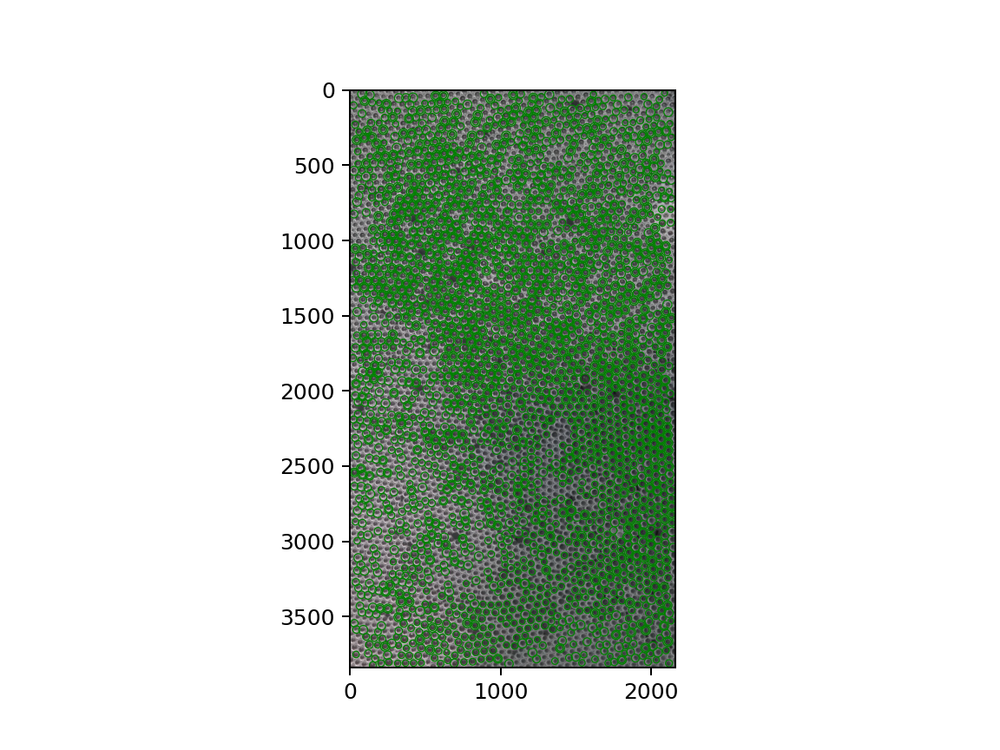

In [22]:
#for thresholded image
circles1 = cv2.HoughCircles(th, cv2.HOUGH_GRADIENT_ALT, 0.1, 36,param1=100 ,param2=0.01 ,minRadius=18,maxRadius=36 )
circles1=circles1[0, :]
print(circles1)
fig=plt.figure(dpi= 150, facecolor='w', edgecolor='k')
ax=fig.gca()
plt.ion()
plt.imshow(output1)
for (x,y,r) in circles1:
    cc = plt.Circle(( x , y ), r ,fill=False,color='g',lw=0.5)
    #cc = plt.Circle(( x , y ), 1 ,fill=True,color='r',lw=0.5)
    ax.add_artist( cc )


plt.show()

<IPython.core.display.Javascript object>


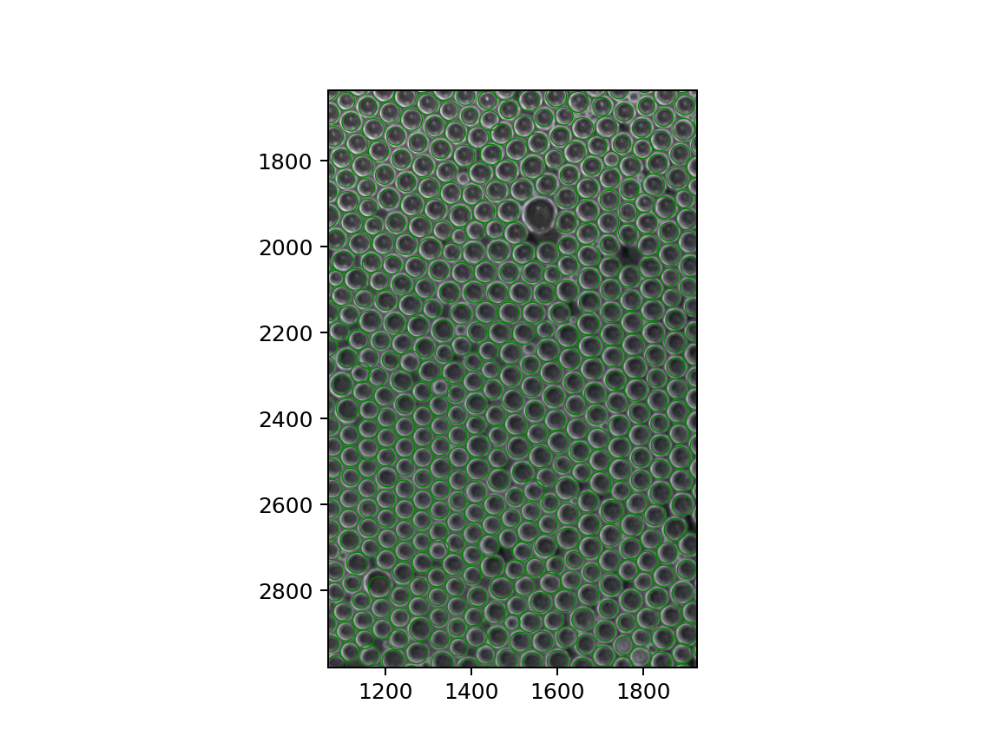

In [81]:
#for thresholded image
circles1 = cv2.HoughCircles(th, cv2.HOUGH_GRADIENT, 0.00001, 36,param1=30 ,param2=10 ,minRadius=18 ,maxRadius=26 )
circles1=circles1[0, :]
fig=plt.figure(dpi= 150, facecolor='w', edgecolor='k')
ax=fig.gca()
plt.ion()
plt.imshow(output1)
for (x,y,r) in circles1:
    cc = plt.Circle(( x , y ), r ,fill=False,color='g',lw=0.5)
    #cc = plt.Circle(( x , y ), 1 ,fill=True,color='r',lw=0.5)
    ax.add_artist( cc )


plt.show()

In [11]:
def hc(r):
    circles1 = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 0.00001, 2*r,param1=50 ,param2=15 ,minRadius=r ,maxRadius=r+1 )
    #circles1 = np.round(circles1[0, :]).astype("int")
    
    circles1=circles1[0, :]#[:,0:2]
    return circles1


minr=18
maxr=30
for i in range(minr,maxr):
    if i==minr:
        circles2=hc(i)
    else:
        circles2=np.concatenate([circles2,hc(i)])
    print(circles2.shape)
#print(circles2.shape)
output1 = image.copy()

(970, 3)
(2227, 3)
(3517, 3)
(4730, 3)
(5766, 3)
(6509, 3)
(6970, 3)
(7313, 3)
(7504, 3)
(7605, 3)
(7661, 3)
(7675, 3)


<IPython.core.display.Javascript object>


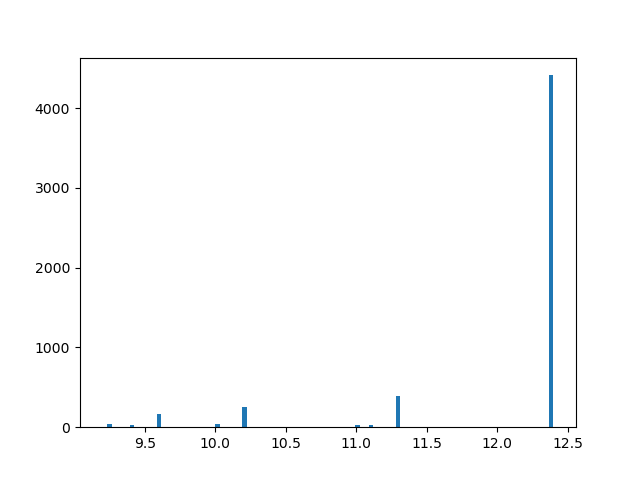

(array([2.000e+00, 3.800e+01, 0.000e+00, 0.000e+00, 5.000e+00, 0.000e+00,
        2.300e+01, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.690e+02, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 3.700e+01, 0.000e+00, 0.000e+00, 3.000e+00, 0.000e+00,
        0.000e+00, 2.590e+02, 0.000e+00, 0.000e+00, 4.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        0.000e+00, 0.000e+00, 2.200e+01, 0.000e+00, 0.000e+00, 3.000e+01,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 3.900e+02,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

In [29]:
#plt.plot(range(circles1[:,2].size),circles1[:,2])
plt.figure()
plt.hist(circles1[:,2],bins=100)
#fig=plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')

In [ ]:
coords1=circles1[:,:-1]
g_r1, radii1 = rdf(coords1, dr=1)

radii1=radii1/radii1[g_r1.argmax()]
#print(radii)

<IPython.core.display.Javascript object>


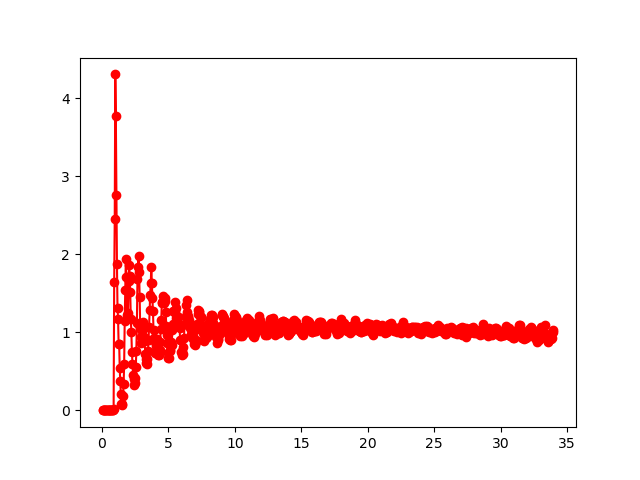

In [ ]:
plt.figure()
plt.plot(radii1,g_r1,"ro-",label='image 1')
fig.set_figheight(100)
fig.set_figwidth(100)

plt.show()

<IPython.core.display.Javascript object>


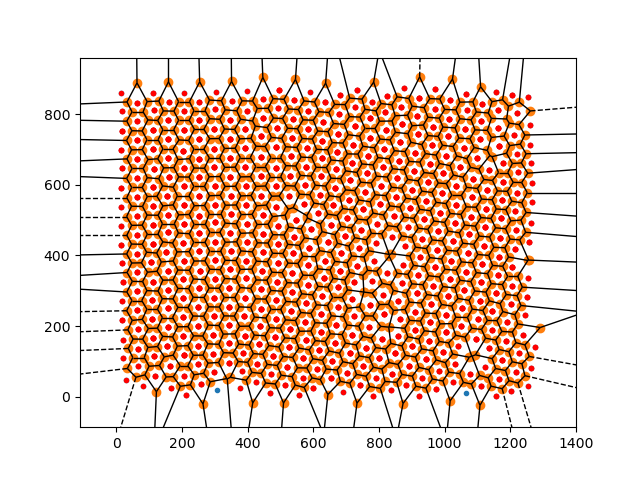

In [34]:
vor1 = Voronoi(coords1)
fig1 = voronoi_plot_2d(vor1)
plt.show()

In [65]:
#list1=list(vor.ridge_points[:,0])+list(vor.ridge_points[:,0])
nos1=[]
for i in vor1.regions:
    nos1.append(len(i))
nn1=Counter(nos1)
od1 = OrderedDict(sorted(nn1.items()))

In [66]:
plt.plot(od1.keys(),od1.values(),linestyle='--', marker='o', color='b', label='line with marker')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


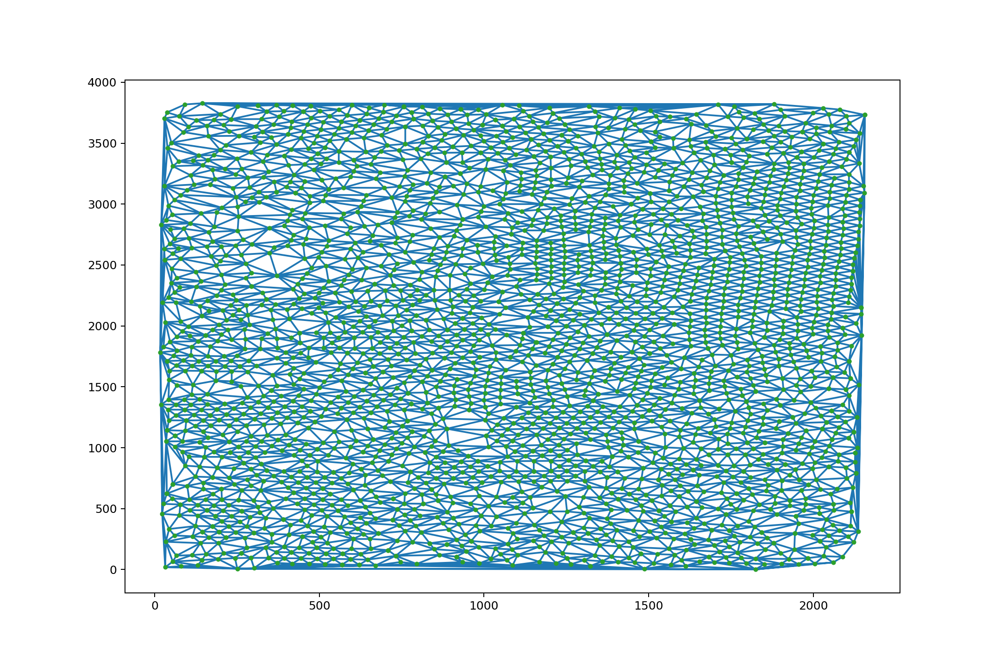

In [147]:
fig=plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')
coords1=circles1[:,:2]
tri1 = Delaunay(coords1)
plt.triplot(coords1[:,0], coords1[:,1], tri1.simplices)
plt.plot(coords1[:,0], coords1[:,1], '.')
plt.savefig('triplot1.png')
plt.show()

In [26]:
tri1.vertex_neighbor_vertices[0].shape

(3643,)

<IPython.core.display.Javascript object>


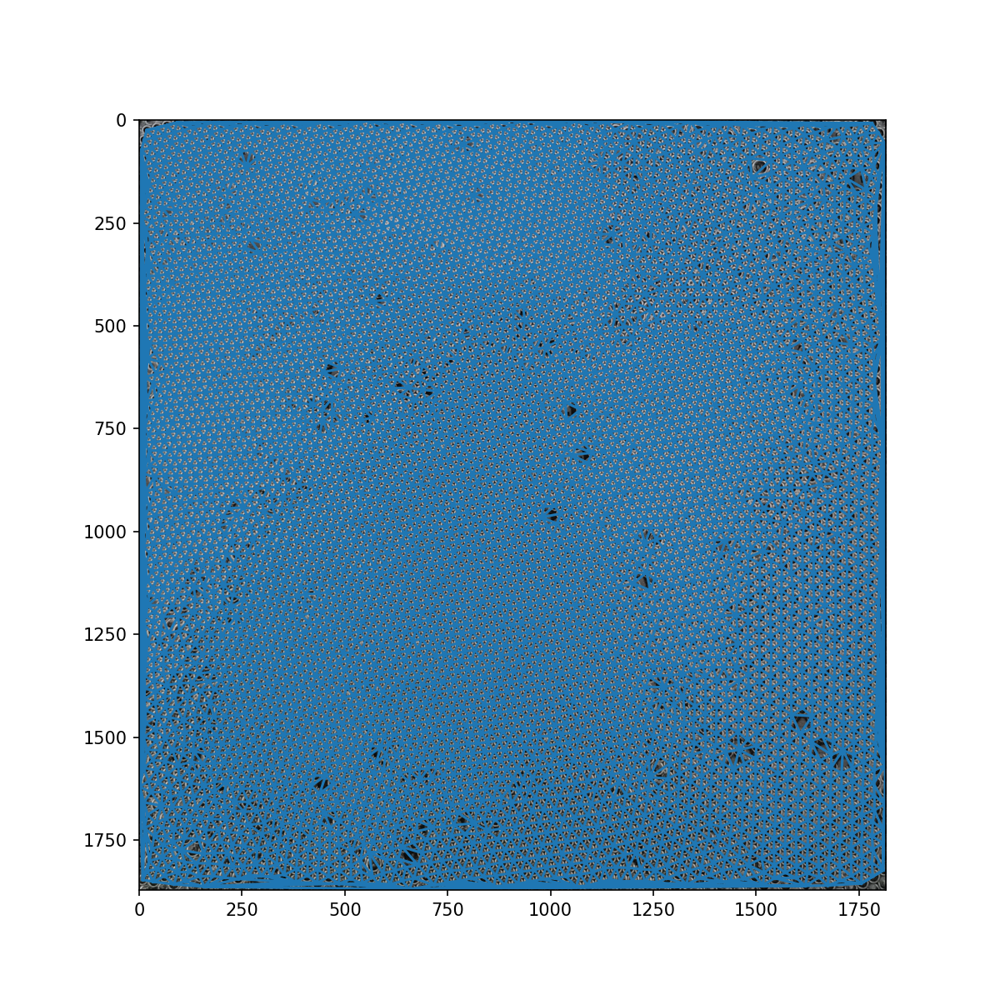

In [34]:
fig=plt.figure(figsize=(8,8), dpi= 150, facecolor='w', edgecolor='k')
coords1=circles1[:,:2]
tri1 = Delaunay(coords1)
plt.imshow(image)
plt.triplot(coords1[:,0], coords1[:,1], tri1.simplices)
plt.plot(coords1[:,0], coords1[:,1], '.')
#plt.plot(pts[:,0],pts[:,1],'r.')
#plt.savefig('triplot1.png')
plt.show()

<IPython.core.display.Javascript object>


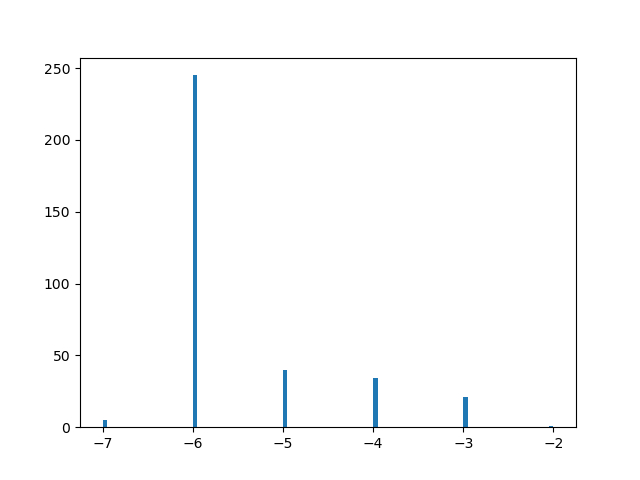

(array([  5.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 245.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,  40.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,  34.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,  21.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([-7.  , -6.95, -6.9 , -6.85, -6.8 , -6.75, -6.7 , -6.65, -6.6 ,
        -6.55, -6.5 , -6.45, -6.4 , -6.35, -6.3 , -6.25, -6.2 , -6.15,
        -6.1 , -6.05, -6.  , -5.95, -5.9 , -5.85, -5.8 , -5.75, -5.7 ,
        -5.65, -5.6 , -5.55, -5.5 , -5.45, -5.4 , -5.35, -5.3 , -5.25,
        -5.2 , -5.15, -5.1 , -5.05

In [501]:
plt.figure()
plt.hist(E,bins=100)

In [35]:
xs=(tri1.vertex_neighbor_vertices[0][1:]-tri1.vertex_neighbor_vertices[0][:-1])
idx=np.where(xs==6)[0]
mean=0
min=-1
for i in idx:
    centre=tri1.points[i]
    indices=tri1.vertex_neighbor_vertices[0][i:i+2]
    pts=tri1.points[tri1.vertex_neighbor_vertices[1][indices[0]:indices[1]]]
    indxs=tri1.vertex_neighbor_vertices[1][indices[0]:indices[1]]
    r=np.linalg.norm(pts-centre,axis=1)#-circles1[indxs,2]-circles1[i,2]
    mean+=np.sum(r)
    if min==-1:
        min=np.min(r)
    elif np.min(r)<min:
        min=np.min(r)
    #if i==10:
        #plt.plot(centre[0],centre[1],'b.')
        #plt.plot(pts[:,0],pts[:,1],'r.')
mean=mean/(6*len(idx))
print(mean)
print(min)

26.74269358535977
18.0


In [564]:
E=np.zeros(len(xs))
n=np.zeros(len(xs))
rs=np.array([])
for i in range(len(xs)):
    centre=tri1.points[i]
    indices=tri1.vertex_neighbor_vertices[0][i:i+2]
    pts=tri1.points[tri1.vertex_neighbor_vertices[1][indices[0]:indices[1]]]
    n[i]=len(pts)
    E[i]=morseenergy(pts,centre,i,tri1.vertex_neighbor_vertices[1][indices[0]:indices[1]])
    rs=np.append(rs,np.linalg.norm(pts-centre,axis=1))
    #if np.isnan(E[i]):
        #print(pts,centre,mean)

<IPython.core.display.Javascript object>


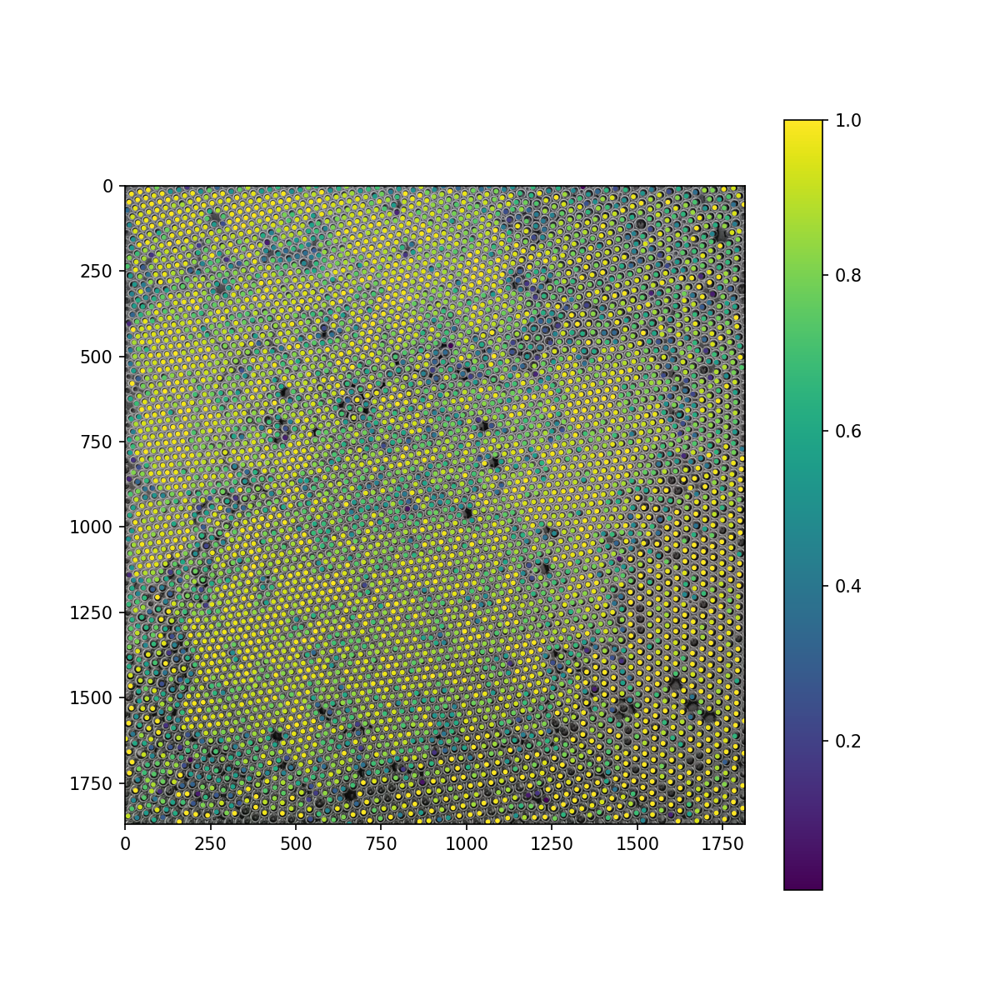

In [45]:
fig=plt.figure(figsize=(8,8), dpi= 150, facecolor='w', edgecolor='k')
plt.scatter(tri1.points[:,0], tri1.points[:,1],s=3,c=np.abs(psi_T))
plt.colorbar()
plt.imshow(image)
plt.show()

In [565]:
rs

array([54.58937626, 54.14794548, 58.30951895, ..., 48.83646179,
       51.92301994, 53.33854141])

In [451]:
#Mask to ignore boundary
mask=(coords1[:,0]<1200) & (coords1[:,0]>35) & (coords1[:,1]<820) & (coords1[:,1]>100)
print(mask)

[ True False  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True False  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True False
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True False  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True False  True False  True  True  True False  T

<IPython.core.display.Javascript object>


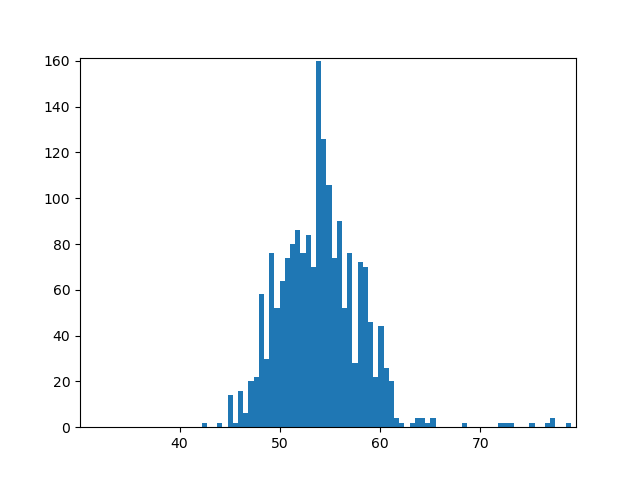

(array([  2.,   0.,   0.,   2.,   0.,  14.,   2.,  16.,   6.,  20.,  22.,
         58.,  30.,  76.,  52.,  64.,  74.,  80.,  86.,  76.,  84.,  70.,
        160., 126., 106.,  74.,  90.,  52.,  76.,  28.,  72.,  70.,  46.,
         22.,  44.,  26.,  20.,   4.,   2.,   0.,   2.,   4.,   4.,   2.,
          4.,   0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,
          0.,   0.,   2.,   2.,   2.,   0.,   0.,   0.,   2.,   0.,   0.,
          2.,   4.,   0.,   0.,   2.,   0.,   2.,   0.,   0.,   2.,   2.,
          2.,   4.,   0.,   0.,   0.,   4.,   0.,   2.,   2.,   4.,   2.,
          0.,   2.,   0.,   0.,   6.,   0.,   2.,   2.,   0.,   6.,   0.,
          2.,   0.,   8.,   0.,   2.,   0.,   2.,   2.,   0.,   0.,   0.,
          2.,   2.,   0.,   2.,   0.,   4.,   2.,   6.,   0.,   2.,   2.,
          0.,   0.,   0.,   2.,   0.,   0.,   2.,   0.,   0.,   2.,   0.,
          0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0., 

In [568]:
plt.figure()
plt.hist(rs,bins=1000)

<IPython.core.display.Javascript object>


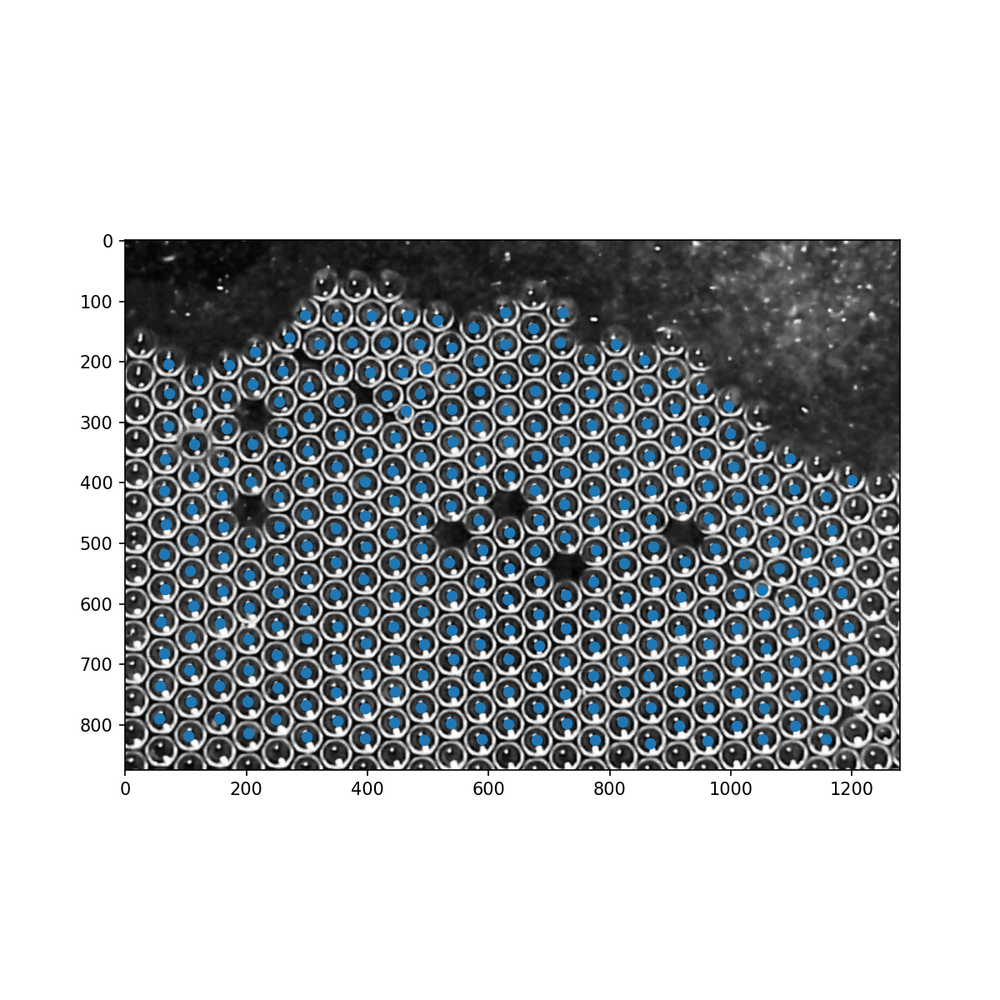

In [291]:
fig=plt.figure(figsize=(8,8), dpi= 150, facecolor='w', edgecolor='k')
plt.scatter(coords1[mask][:,0], coords1[mask][:,1],s=30)
plt.imshow(image)
plt.show()

In [101]:
np.linalg.norm(pts-pts[0],axis=1)

array([  0.        , 109.11461864,  53.82378656,  94.51454914])

In [133]:
def quadenergy(pts,centre,x0):
    return (np.sum(np.linalg.norm(pts-centre,axis=1))-6*x0)**2

In [261]:
def ljenergy(pts,centre,x0):
    sigma=x0/(2**(1/6))
    r=np.linalg.norm(pts-centre,axis=1)
    V=np.sum((sigma/r)**12-(sigma/r)**6)
    if V>5:
        return 0
    if len(pts)==5 or len(pts)==7 or len(pts)==8 or len(pts)==4:
        return V
    if len(pts)==6:
        return V

In [548]:
def morseenergy(pts,centre,i,indxs):
    r=np.linalg.norm(pts-centre,axis=1)#-circles1[indxs,2]-circles1[i,2]
    #r=r[r<(1.5*mean)]
    a=np.log(2)/(mean-min)
    V=np.sum((1-np.exp(-a*(r-mean)))**2)
    #if len(r)==5:
        #print((1-np.exp(-a*(r-mean)))**2,V)
    #V=-len(r)
    #if len(r)>8:
        #return 0.5
    return V

In [606]:
from scipy import interpolate
#tck = interpolate.bisplrep(tri1.points[:,0], tri1.points[:,1], E, s=2)
#znew = interpolate.bisplev(tri1.points[:,0], tri1.points[:,1], tck)
XI, YI = np.meshgrid(np.linspace(35, 1235, 1000), np.linspace(35, 835, 1000))
rbf = interpolate.Rbf(tri1.points[:,0], tri1.points[:,1], np.abs(psi_T),function='gaussian')
ZI = rbf(XI, YI)

In [39]:
len(psi_T),len(circles1)

(5408, 5408)

<IPython.core.display.Javascript object>


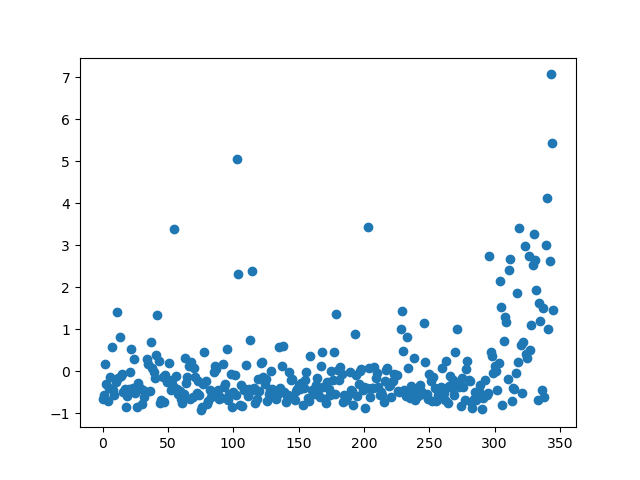

In [558]:
plt.figure()
plt.plot((E-np.mean(E))/np.mean(E),'o')

In [557]:
(E-np.mean(E))/np.mean(E)

array([-6.48556818e-01, -5.61396885e-01,  1.76928405e-01, -3.00563047e-01,
       -7.18386659e-01, -4.08722020e-01, -1.46940055e-01,  5.69578606e-01,
       -4.34914733e-01, -5.59090960e-01, -2.51453437e-01,  1.41226658e+00,
       -1.60050746e-01,  8.10111682e-01, -1.20151953e-01, -6.37540016e-02,
       -4.85728810e-01, -4.25362545e-01, -8.41665978e-01, -5.85156810e-01,
       -4.26525113e-01, -2.39488864e-02,  5.36065988e-01, -4.02007684e-01,
        2.94764880e-01, -5.17078959e-01, -8.55715958e-01, -2.76102637e-01,
       -4.06907623e-01, -4.07881357e-01, -7.68216557e-01, -4.41440339e-01,
       -6.12540844e-01, -4.85423227e-01,  2.86982344e-01,  1.82733719e-01,
       -4.65110623e-01,  6.88456769e-01,  8.50530176e-02, -2.37723150e-02,
       -1.65544999e-01,  3.99558099e-01,  1.35111567e+00,  2.52640229e-01,
       -7.57237690e-01, -6.85094994e-01, -1.39816601e-01, -7.24480612e-01,
       -7.67129238e-02, -2.59054914e-01, -2.10935294e-01,  2.01365174e-01,
       -4.54485902e-01, -

<IPython.core.display.Javascript object>


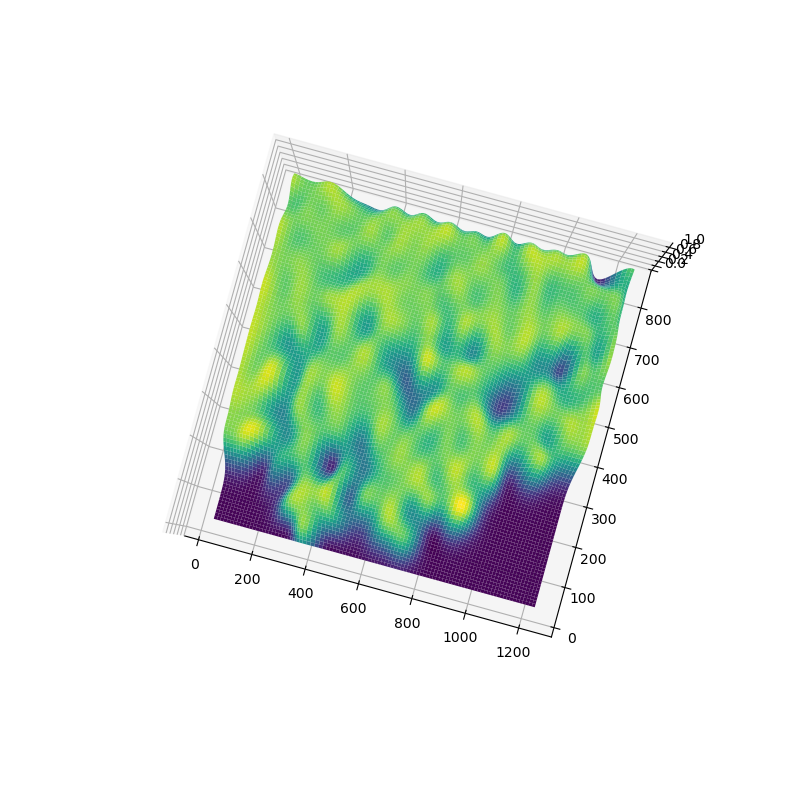

C:\Users\Anpuj\AppData\Local\Temp\ipykernel_7908\2408668065.py:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


In [608]:
fig = plt.figure(figsize=(8,8))
ax = fig.gca(projection='3d')
ax.plot_surface(XI, YI, ZI, cmap='viridis', rstride=10, cstride=10, antialiased=True)
plt.show()

<IPython.core.display.Javascript object>


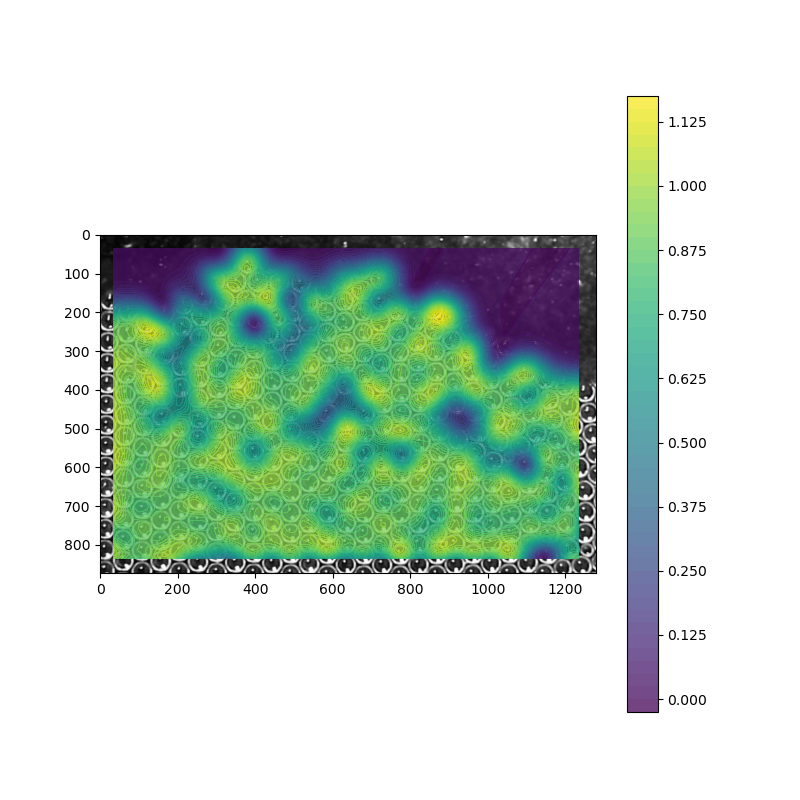

In [612]:
fig = plt.figure(figsize=(8,8))
plt.contourf(XI,YI,ZI,levels=50,alpha=0.75)
plt.colorbar()
plt.imshow(image)
plt.show()

In [33]:
#BOP
centroids=coords1
psi_T = 1j*np.zeros(len(centroids))
#a = 170
#G = ((4*np.pi/(a*np.sqrt(3)))* np.array([0.5*np.sqrt(3),0.5])) +((4*np.pi/(a*np.sqrt(3)))* np.array([0,1]))
neighbors = np.empty(len(centroids),dtype=object)

for i in range(len(xs)):
    centre=tri1.points[i]
    indices=tri1.vertex_neighbor_vertices[0][i:i+2]
    pts=tri1.points[tri1.vertex_neighbor_vertices[1][indices[0]:indices[1]]]
    r=np.linalg.norm(pts-centre,axis=1)
    count=0
    for j in range(-1,len(pts)-1):
        if r[j]<1.15*mean:
            theta = np.arccos(np.dot(pts[j]-centre,pts[j+1]-centre)/np.sqrt(np.dot(pts[j]-centre,pts[j]-centre)*np.dot(pts[j+1]-centre,pts[j+1]-centre)))
            psi_T[i]=psi_T[i]+np.exp(1j*6*theta)
            count+=1
    psi_T[i]=psi_T[i]/count
"""
for i in range(len(centroids)):
    count=0
    for j in tri1.simplices:
        if i in j:
            count+=1
            p1 = centroids[i]
            p2 = centroids[j[j!=i][0]]
            p3 = centroids[j[j!=i][1]]
            theta = np.arccos(np.dot(p2-p1,p3-p1)/np.sqrt(np.dot(p2-p1,p2-p1)*np.dot(p3-p1,p3-p1)))
            psi_T[i]=psi_T[i]+np.exp(1j*6*theta)
    psi_T[i]=psi_T[i]/count
"""
"""
    if i in j:
        count+=1
        p1 = centroids[i]
        p2 = centroids[j[j!=i][0]]
        p3 = centroids[j[j!=i][1]]
        #theta =
#psi_T[i] = np.exp(1j*np.dot(G,centroids[i]))
#here r_i is the position vector from origin
#taking it to be the nearest neighbor vector,
psi_T[i] = np.exp(1j*np.dot(G,p2-p1))
""" 
print(np.abs(np.mean(psi_T)))

C:\Users\Anpuj\AppData\Local\Temp\ipykernel_632\1932102731.py:19: RuntimeWarning: invalid value encountered in cdouble_scalars
  psi_T[i]=psi_T[i]/count


nan


In [ ]:
import cv2
import numpy as np

img = cv2.imread('20220608_151134.jpg', cv2.IMREAD_COLOR)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,50,150,apertureSize = 3)

lines = cv2.HoughLines(edges,1,np.pi/180,200)
 
for rho,theta in lines[0]:
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv2.line(img,(x1,y1),(x2,y2),(0,0,255),2)

#cv2.imwrite('houghlines3.jpg',img)
cv2.imshow("Result Image", img)

<IPython.core.display.Javascript object>


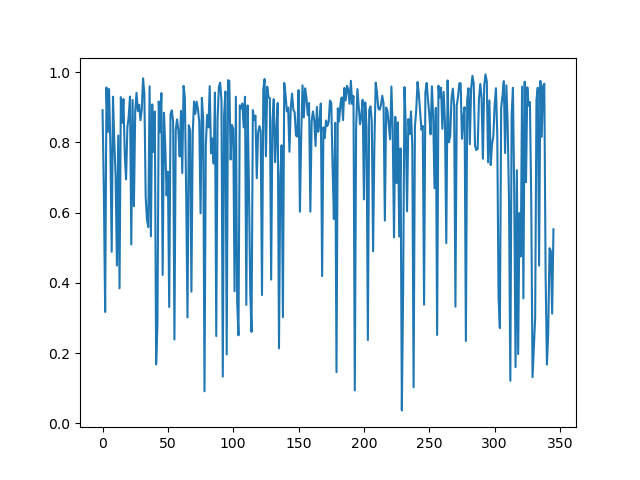

In [510]:
plt.figure()
plt.plot(range(len(psi_T)),np.abs(psi_T))

<IPython.core.display.Javascript object>


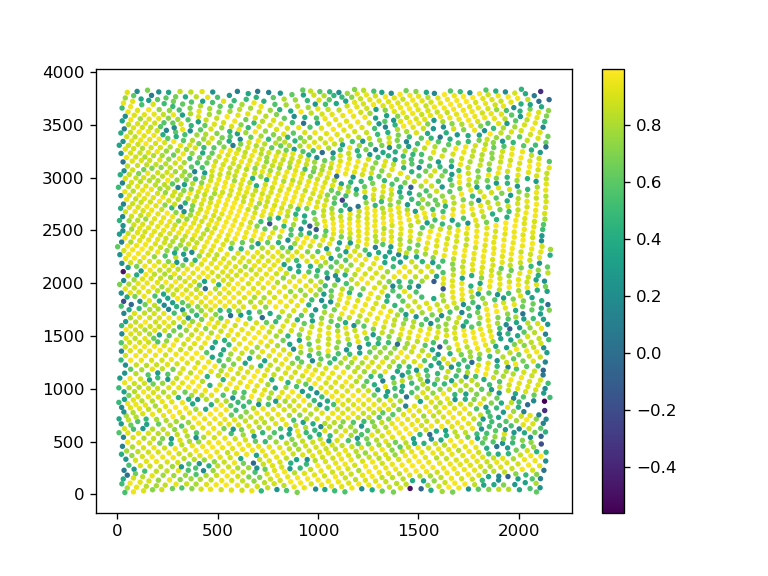

In [47]:
plt.figure()
#xx,yy=np.meshgrid(centroids[:,0],centroids[:,1])
plt.scatter(centroids[:,0],centroids[:,1],s=5,c=psi_T)
plt.colorbar()

In [610]:
centroids.shape

(346, 2)

In [1]:
image1 = cv2.imread('frame330.png')
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

image2 = cv2.imread('frame359.png')
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

circles1 = cv2.HoughCircles(gray1, cv2.HOUGH_GRADIENT, 0.0001, 42,param1=50 ,param2=12 ,minRadius=21 ,maxRadius=24 )
circles1=circles1[0, :]

circles2 = cv2.HoughCircles(gray2, cv2.HOUGH_GRADIENT, 0.0001, 42,param1=50 ,param2=12 ,minRadius=21 ,maxRadius=24 )
circles2=circles2[0, :]

NameError: name 'cv2' is not defined

In [659]:
def track(c1,c2):
    diff=[]
    for c in c2:
        cx=c[:2]
        dist=np.linalg.norm(c1[:,:2]-cx,axis=1)
        if np.min(dist)>10:
            diff.append([0,0])
        else:
            closest=np.argmin(dist)
            diff.append(list(c1[:,:2][closest]-cx))
    return diff
diff=np.array(track(circles1,circles2))
newcircles1=circles2+diff

<IPython.core.display.Javascript object>


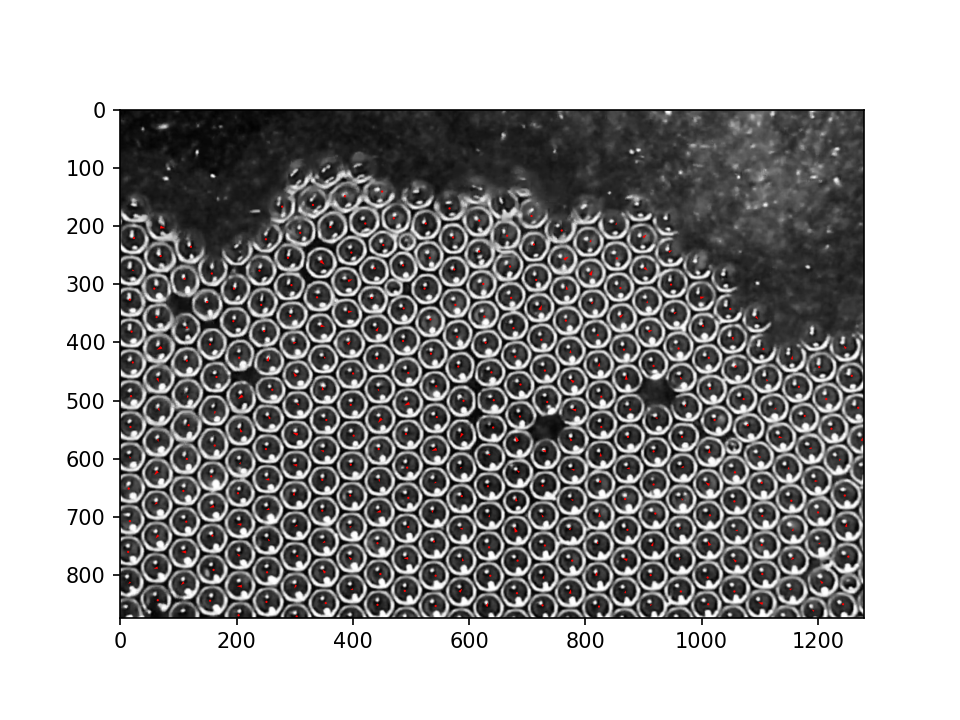

In [660]:
plt.figure(dpi=150)
plt.imshow(image2)
plt.quiver(circles2[:,0],circles2[:,1],diff[:,0],diff[:,1],color='r',angles='xy', scale_units='xy', scale=1)
plt.show()

In [652]:
diff

array([[ 0.,  3.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 0.,  0.],
       [-4.,  5.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 8.,  2.],
       [-2., -4.],
       [-5., -4.],
       [ 4.,  4.],
       [ 0.,  0.],
       [-3.,  1.],
       [ 1., -1.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 2.,  0.],
       [ 0.,  0.],
       [ 6., -1.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 7.,  6.],
       [ 5., -4.],
       [ 0.,  1.],
       [-1.,  3.],
       [ 0.,  0.],
       [-4., -1.],
       [-5., -4.],
       [ 2., -5.],
       [ 2.,  2.],
       [ 0.,  0.],
       [-1.,  0.],
       [ 6.,  2.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 5.,  7.],
       [ 0.,  0.],
       [ 5., -2.],
       [ 0., -9.],
       [-8., -2.],
       [-2.,  3.],
       [ 3., -2.],
       [-6.,  2.],
       [ 4.,  2.],
       [-6.,  2.],
       [ 0.,  0.],
       [ 0.,  0.],
       [ 3.,  2.],
       [-1.,  6.],
       [-8., -4.],
       [ 4.,

In [ ]:
from matplotlib import pyplot as plt  
from matplotlib import animation  
import matplotlib.image as mgimg
import numpy as np

#set up the figure
fig = plt.figure()
ax = plt.gca()
cam = cv2.VideoCapture("C0018.mp4")
#initialization of animation, plot array of zeros 

def animate(i):
    print(i)
    ret,frame = cam.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    imobj=ax.imshow(gray,animated=True)
    return  imobj,

## create an AxesImage object
ret,frame = cam.read()
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
imobj=ax.imshow(gray)
#imobj = ax.imshow( np.zeros((100, 100)), origin='lower', alpha=1.0, zorder=1, aspect=1 )

anim = animation.FuncAnimation(fig, animate, frames=100, blit=True, repeat = True, interval=100, repeat_delay=1000)

plt.show()
cam.release()
cv2.destroyAllWindows()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig = plt.figure()
cam = cv2.VideoCapture("C0018.mp4")
ret,frame = cam.read()
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

im = plt.imshow(gray, animated=True)

def updatefig(*args):
    ret,frame = cam.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    im.set_array(gray)
    return im,

ani = animation.FuncAnimation(fig, updatefig, interval=1, blit=True)
plt.show()

In [ ]:
import pylab as plt
import numpy
import matplotlib.animation as animation
#plt.rcParams['animation.ffmpeg_path'] = r"C:\some_path\ffmpeg.exe"   # if necessary

# Generate data for plotting
Lx = Ly = 3
Nx = Ny = 11
Nt = 20
x = numpy.linspace(0, Lx, Nx)
y = numpy.linspace(0, Ly, Ny)
x,y = numpy.meshgrid(x,y)
z0 = numpy.exp(-(x-Lx/2)**2-(y-Ly/2)**2)   # 2 dimensional Gaussian

def some_data(i):   # function returns a 2D data array
    return z0 * (i/Nt)

fig = plt.figure()
ax = plt.axes(xlim=(0, Lx), ylim=(0, Ly), xlabel='x', ylabel='y')

cvals = numpy.linspace(0,1,Nt+1)      # set contour values 
cont = plt.contourf(x, y, some_data(0), cvals)    # first image on screen
plt.colorbar()

# animation function
def animate(i):
    global cont
    z = some_data(i)
    for c in cont.collections:
        c.remove()  # removes only the contours, leaves the rest intact
    cont = plt.contourf(x, y, z, cvals)
    plt.title('t = %i:  %.2f' % (i,z[5,5]))
    return cont

anim = animation.FuncAnimation(fig, animate, frames=Nt, repeat=False)